In [1]:
#We only need to install once so we dont need to run this cell again

!pip install scanpy
!pip install gprofiler-official

     |████████████████████████████████| 7.2MB 5.0MB/s eta 0:00:01
     |████████████████████████████████| 12.5MB 331kB/s eta 0:00:01    |█████████████████████           | 8.2MB 1.2MB/s eta 0:00:04
     |████████████████████████████████| 3.0MB 887kB/s eta 0:00:01     |██████▋                         | 614kB 1.5MB/s eta 0:00:02
     |████████████████████████████████| 122kB 1.5MB/s eta 0:00:01
     |████████████████████████████████| 71kB 1.4MB/s eta 0:00:01
     |████████████████████████████████| 51kB 4.4MB/s eta 0:00:01
     |████████████████████████████████| 573kB 2.4MB/s eta 0:00:01
  Stored in directory: /Users/harpreetsetia/Library/Caches/pip/wheels/81/d9/a7/91f374756d0966c04104d388ad3b288f332ba706490e8a0fd4
Successfully built umap-learn
ERROR: umap-learn 0.4.4 has requirement numba!=0.47,>=0.46, but you'll have numba 0.44.1 which is incompatible.
ERROR: umap-learn 0.4.4 has requirement numpy>=1.17, but you'll have numpy 1.16.4 which is incompatible.
ERROR: umap-learn 0.4.4 has requi

In [101]:
!pip install python-igraph

     |████████████████████████████████| 2.4MB 56kB/s eta 0:00:011


In [1]:
!pip install --upgrade louvain

Requirement already up-to-date: louvain in ./anaconda3/lib/python3.7/site-packages (0.7.0)


In [47]:
!pip install --upgrade scipy

     |████████████████████████████████| 28.4MB 235kB/s eta 0:00:01    |█████████                       | 7.9MB 2.9MB/s eta 0:00:08     |███████████                     | 9.7MB 2.9MB/s eta 0:00:07     |█████████████▋                  | 12.1MB 2.9MB/s eta 0:00:06     |██████████████████              | 15.9MB 5.9MB/s eta 0:00:03     |████████████████████▍           | 18.1MB 2.3MB/s eta 0:00:05     |█████████████████████▎          | 18.9MB 2.3MB/s eta 0:00:05     |████████████████████████▎       | 21.6MB 2.1MB/s eta 0:00:04     |███████████████████████████▉    | 24.6MB 2.9MB/s eta 0:00:02
ERROR: umap-learn 0.4.4 has requirement numba!=0.47,>=0.46, but you'll have numba 0.44.1 which is incompatible.
ERROR: umap-learn 0.4.4 has requirement numpy>=1.17, but you'll have numpy 1.16.4 which is incompatible.
  Found existing installation: scipy 1.3.0
    Uninstalling scipy-1.3.0:
      Successfully uninstalled scipy-1.3.0


In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
from gprofiler import GProfiler
import igraph
import louvain

In [2]:
sc.settings.verbosity = 3 # verbosity: errors (0), warnings (1), info (2), hints (3) #verbosity refers to the information displayed by the warning messages
sc.settings.set_figure_params(dpi=170, color_map='viridis')  # low dpi (dots per inch) yields small inline figures
sc.logging.print_versions() #print the versions of the packages being used

scanpy==1.5.1 anndata==0.7.3 umap==0.4.4 numpy==1.16.4 scipy==1.4.1 pandas==0.24.2 scikit-learn==0.21.2 statsmodels==0.10.0 python-igraph==0.8.2 louvain==0.7.0


In [3]:
#This is the UC patient SC data (Gut biopsys that were processed)
adata = sc.read_csv('Downloads/GSE150115_Processed_Data_Matrix.csv' # the directory with the `.mtx` file
                   )

In [4]:
adata = sc.AnnData(adata).T

In [5]:
#This is the Crohns SC data (PBMCs)
adata3 = sc.read_10x_mtx('./Downloads/GSM_69_involved/',  # the directory with the `.mtx` file
    var_names='gene_symbols',                  # use gene symbols for the variable names (variables-axis index)
    cache=True)   

... reading from cache file cache/Downloads-GSM_69_involved-matrix.h5ad


In [ ]:
#IGNORE
#df = pd.read_csv('Downloads/GSE150115_Processed_Data_Matrix.csv')
#GSE_data_t = df.T
#GSE_data_t.to_csv('GSE_data_transposed.csv',index = False)
#GSE_data_t.head()
#GSE_data_t = GSE_data_t.rename(columns=GSE_data_t.iloc[0]).drop(GSE_data_t.index[0])
#GSE_data_t.to_csv('GSE_data_transposed.csv',index = False)

In [6]:
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(abs(adata.obs['n_counts']))
adata.obs['n_genes'] = (adata.X > 0).sum(1)

In [7]:
adata3.obs['n_counts'] = adata3.X.sum(1)
adata3.obs['log_counts'] = np.log(abs(adata3.obs['n_counts']))
adata3.obs['n_genes'] = (adata3.X > 0).sum(1)

/Users/harpreetsetia/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in log
  


In [8]:
adata.obs.head()

,n_counts,log_counts,n_genes
SNAP1_TCCATATTTCAT,1400.546875,7.244618,2348
SNAP1_CCGTAACGCGCC,685.083069,6.529540,1951
SNAP1_ACCACAACGACC,1357.953613,7.213734,2322
SNAP1_CTCCTAGGATCC,458.743317,6.128491,1925
SNAP1_TATGCGGGAGAT,1870.931396,7.534192,2369


In [9]:
adata.shape

(3979, 20805)

In [10]:
adata3.obs.head()

,n_counts,log_counts,n_genes
AAACATACAAAACG-1,10.0,2.302585,9
AAACATACAAAAGC-1,3.0,1.098612,3
AAACATACAAACAG-1,0.0,-inf,0
AAACATACAAACGA-1,0.0,-inf,0
AAACATACAAAGCA-1,0.0,-inf,0


In [11]:
adata3.shape

(737280, 33694)

In [12]:
#Data Filtering 
sc.pp.filter_cells(adata3, min_genes = 100) 
sc.pp.filter_genes(adata3, min_cells = 5) 
sc.pp.filter_genes(adata3, min_counts = 15)

filtered out 733133 cells that have less than 100 genes expressed
filtered out 18977 genes that are detected in less than 5 cells
filtered out 2601 genes that are detected in less than 15 counts


In [13]:
print('Number of cells after gene filter: {:d}'.format(adata.n_obs)) 
print('Total number of genes: {:d}'.format(adata.n_vars))

Number of cells after gene filter: 3979
Total number of genes: 20805


In [14]:
print('Number of cells after gene filter: {:d}'.format(adata3.n_obs)) 
print('Total number of genes: {:d}'.format(adata3.n_vars))

Number of cells after gene filter: 4147
Total number of genes: 12116


In [15]:
#Keep the count data in a counts layer
adata3.layers["counts"] = adata3.X.copy()

In [16]:
#A/B
#Normalize the data and log transform it 
sc.pp.normalize_per_cell(adata3) 
sc.pp.log1p(adata3)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [17]:
adata.obs.head()

,n_counts,log_counts,n_genes
SNAP1_TCCATATTTCAT,1400.546875,7.244618,2348
SNAP1_CCGTAACGCGCC,685.083069,6.529540,1951
SNAP1_ACCACAACGACC,1357.953613,7.213734,2322
SNAP1_CTCCTAGGATCC,458.743317,6.128491,1925
SNAP1_TATGCGGGAGAT,1870.931396,7.534192,2369


In [18]:
adata3.obs.head()

,n_counts,log_counts,n_genes
AAACATACACACCA-1,1231.0,7.117206,500
AAACATTGGTGTCA-1,4128.0,8.329417,1277
AAACGCACTTAGGC-1,5785.0,8.666820,1727
AAACGCTGAGAATG-1,693.0,6.543912,274
AAACGCTGCTACCC-1,1325.0,7.192934,627


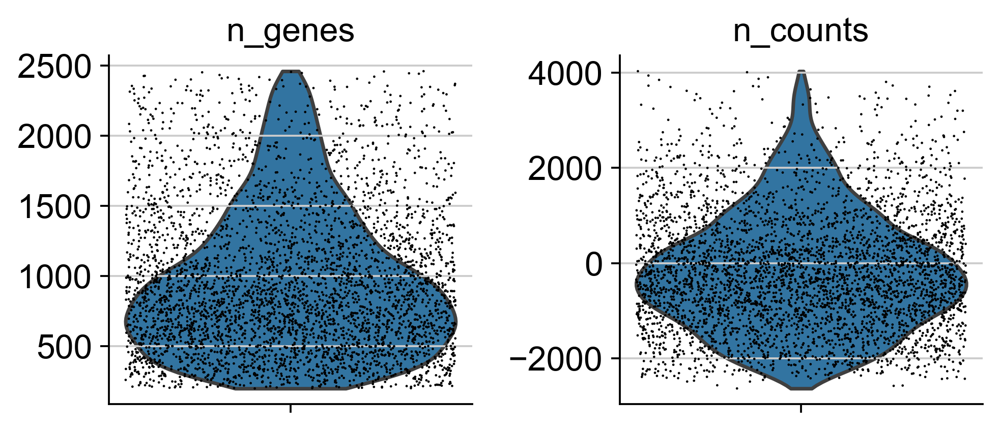

In [19]:
sc.pl.violin(adata, ['n_genes', 'n_counts'],jitter=0.4, multi_panel=True, cut=0)

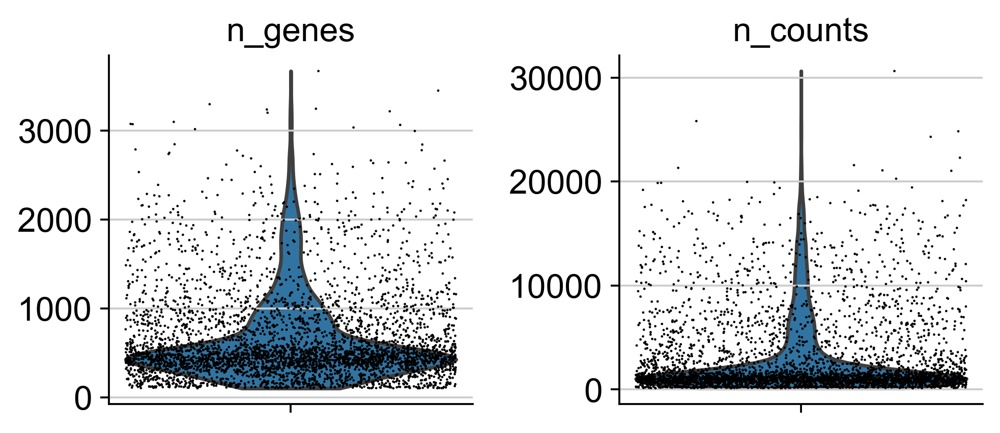

In [20]:
sc.pl.violin(adata3, ['n_genes', 'n_counts'],jitter=0.4, multi_panel=True, cut=0)


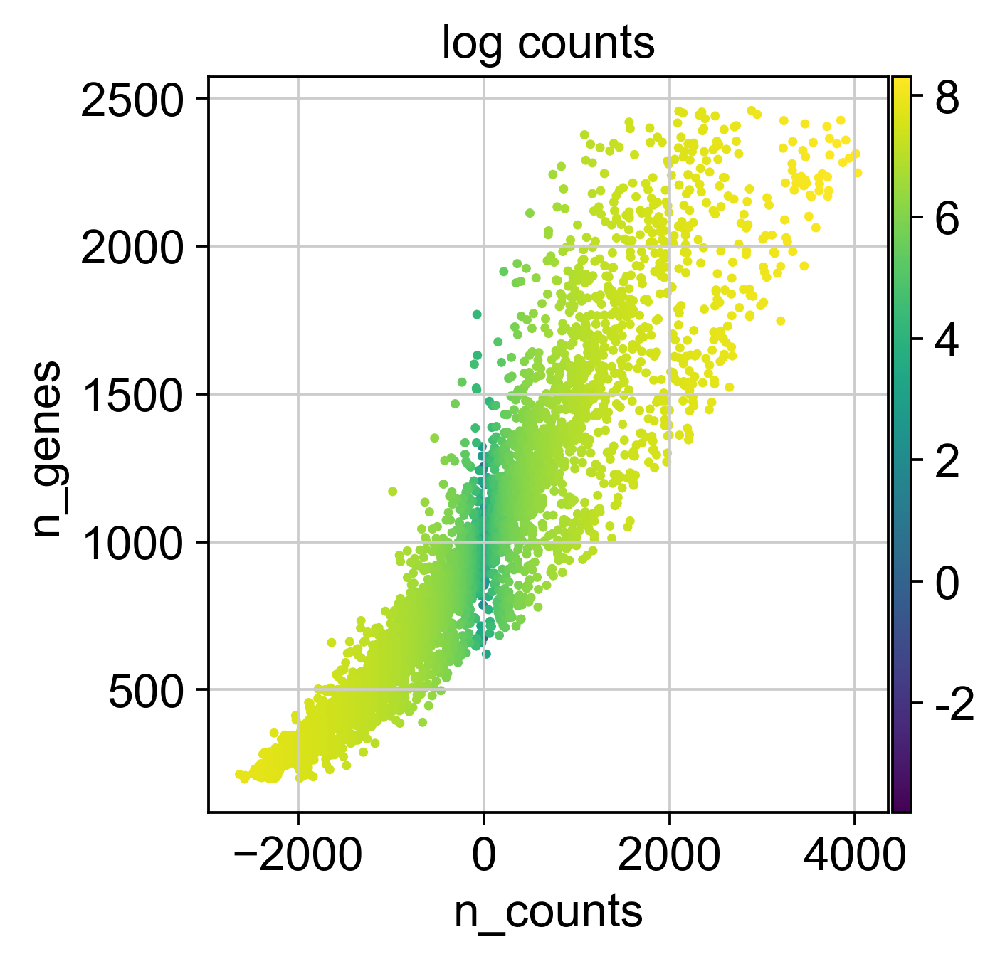

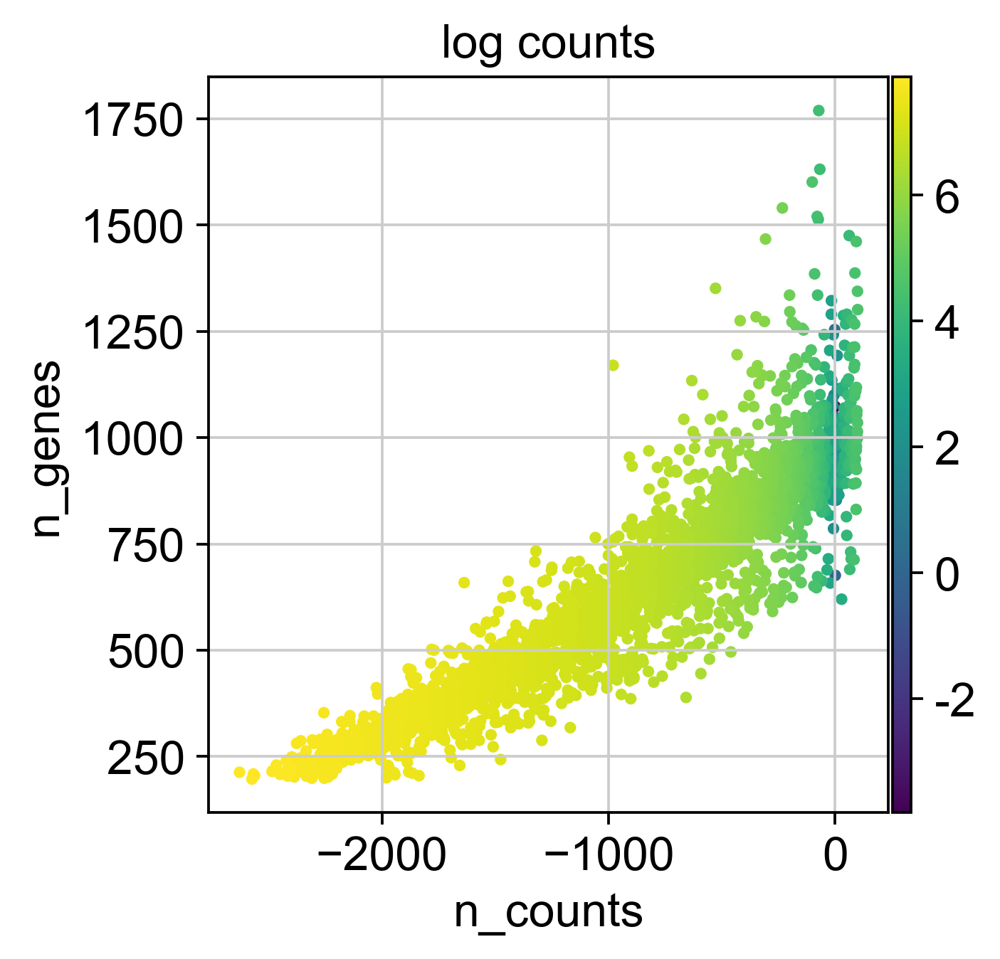

In [21]:
#Data quality summary plots
p1 = sc.pl.scatter(adata, 'n_counts', 'n_genes',color = 'log_counts')
p2 = sc.pl.scatter(adata[adata.obs['n_counts']<100], 'n_counts', 'n_genes',color = 'log_counts')

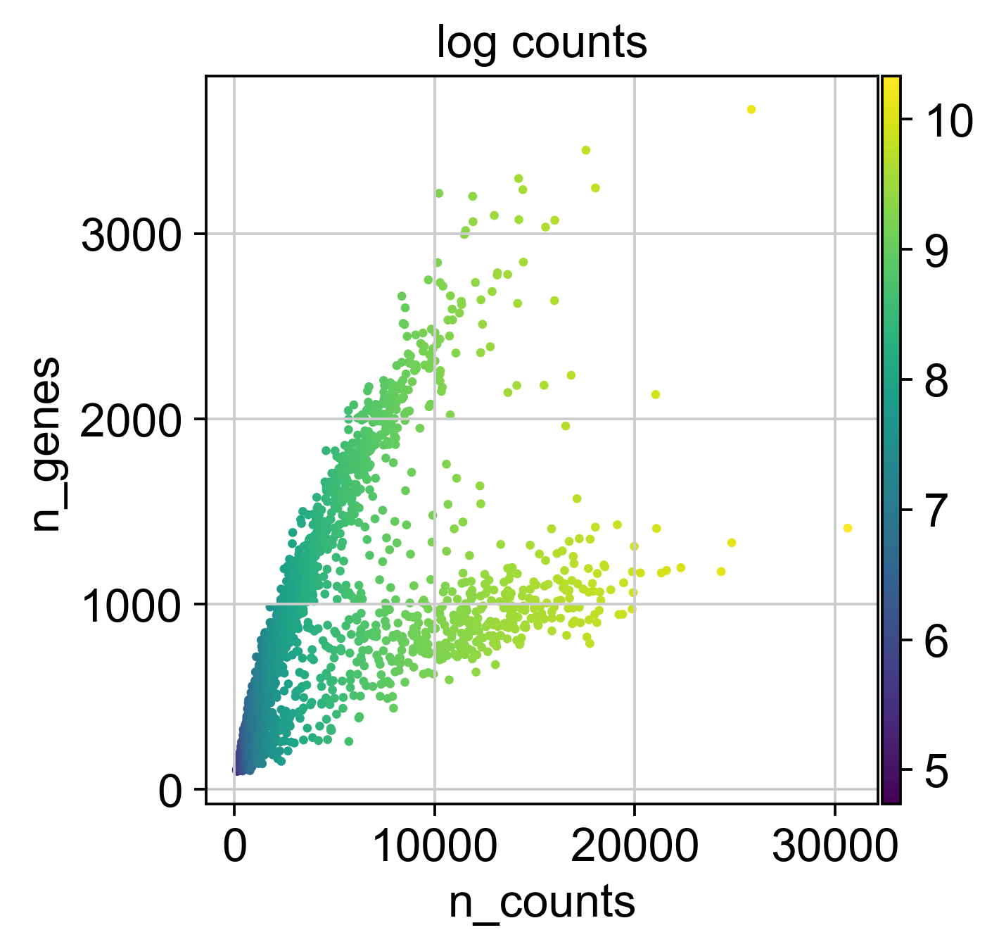

ZeroDivisionError: division by zero

In [22]:
#Data quality summary plots
p1 = sc.pl.scatter(adata3, 'n_counts', 'n_genes',color = 'log_counts')
p2 = sc.pl.scatter(adata3[adata3.obs['n_counts']<100], 'n_counts', 'n_genes',color = 'log_counts')

In [23]:
adata

AnnData object with n_obs × n_vars = 3979 × 20805
    obs: 'n_counts', 'log_counts', 'n_genes'

In [24]:
sc.pp.highly_variable_genes(adata, min_mean=0.01, max_mean=5, min_disp= 0.2)

extracting highly variable genes
    finished (0:00:03)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [25]:
sc.pp.highly_variable_genes(adata3, min_mean=0.01, max_mean=5, min_disp= 0.2)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


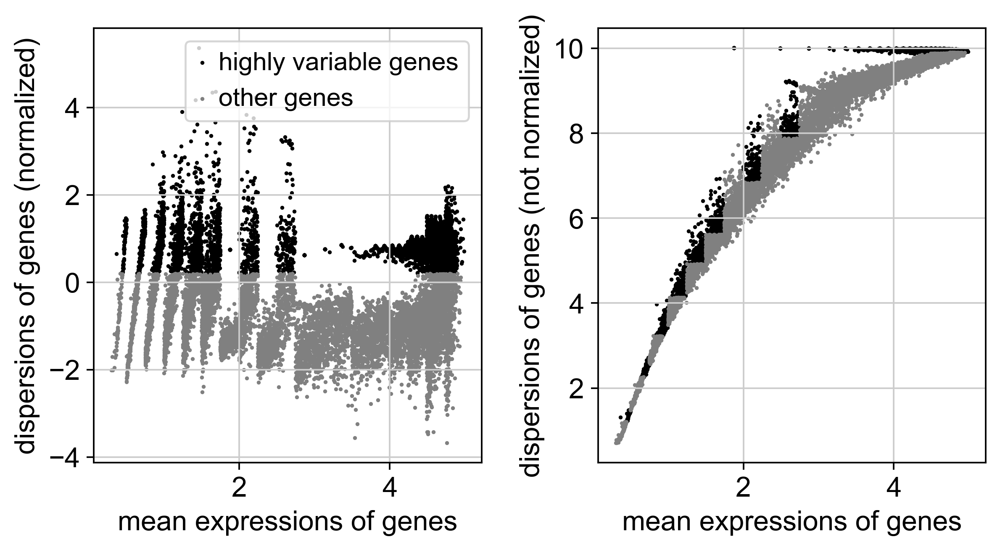

In [26]:
sc.pl.highly_variable_genes(adata)

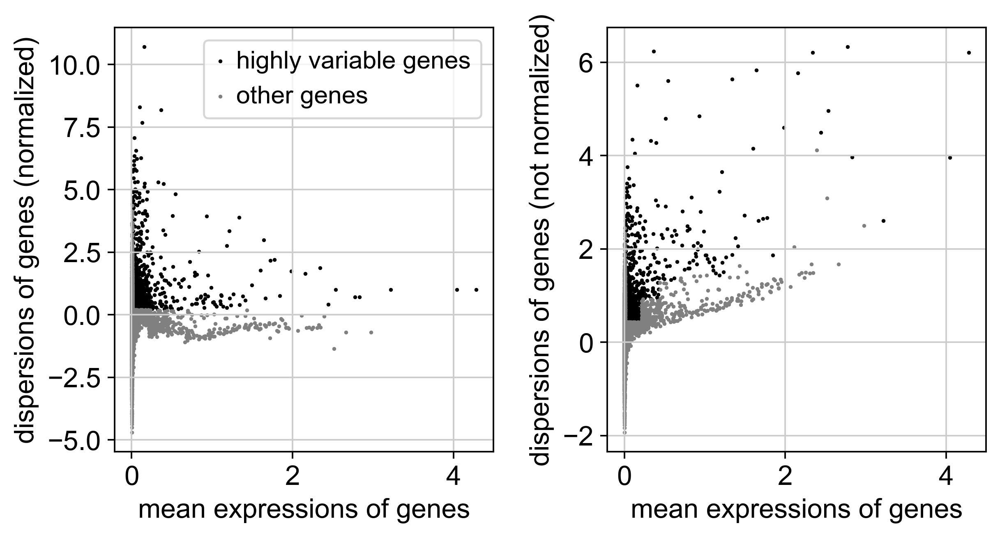

In [27]:
sc.pl.highly_variable_genes(adata3)

In [28]:
sum(adata.var['highly_variable'])

10958

In [29]:
sum(adata3.var['highly_variable'])

3143

In [30]:
adata.var

,highly_variable,means,dispersions,dispersions_norm
A1BG-AS1,False,4.676631e+00,9.865601,0.022584
A1CF,False,4.558439e+00,9.863316,-0.003484
A2M,False,1.375173e+00,4.362511,-1.747836
A2M-AS1,True,3.811996e+00,9.999164,0.837226
A2ML1,True,3.531516e+00,9.999809,0.690531
A4GALT,False,4.703639e+00,9.869109,0.062616
AAAS,False,2.975954e+00,8.948207,-0.645698
AACS,False,3.407736e+00,9.068843,-0.838601
AADAT,True,3.531508e+00,9.999817,0.690551
AAED1,False,3.010802e+00,8.560485,-1.313402


In [31]:
adata3.var

,gene_ids,n_cells,n_counts,highly_variable,means,dispersions,dispersions_norm
FO538757.2,ENSG00000279457,205,228.0,True,0.037758,0.833081,1.025823
AP006222.2,ENSG00000228463,191,212.0,False,0.023587,0.259940,-0.162122
RP11-206L10.9,ENSG00000237491,19,19.0,False,0.002893,-0.045636,-0.795486
LINC00115,ENSG00000225880,47,47.0,False,0.006619,0.146086,-0.398105
FAM41C,ENSG00000230368,34,35.0,False,0.005789,0.475129,0.283898
SAMD11,ENSG00000187634,16,19.0,False,0.001139,-0.367564,-1.462745
NOC2L,ENSG00000188976,252,292.0,True,0.043021,0.819945,0.998598
PLEKHN1,ENSG00000187583,19,19.0,False,0.002276,-0.047848,-0.800071
RP11-54O7.17,ENSG00000272512,17,18.0,False,0.002293,0.154448,-0.380774
HES4,ENSG00000188290,252,520.0,True,0.058484,0.897735,1.159832


computing PCA
    on highly variable genes
    with n_comps=30
    finished (0:00:04)


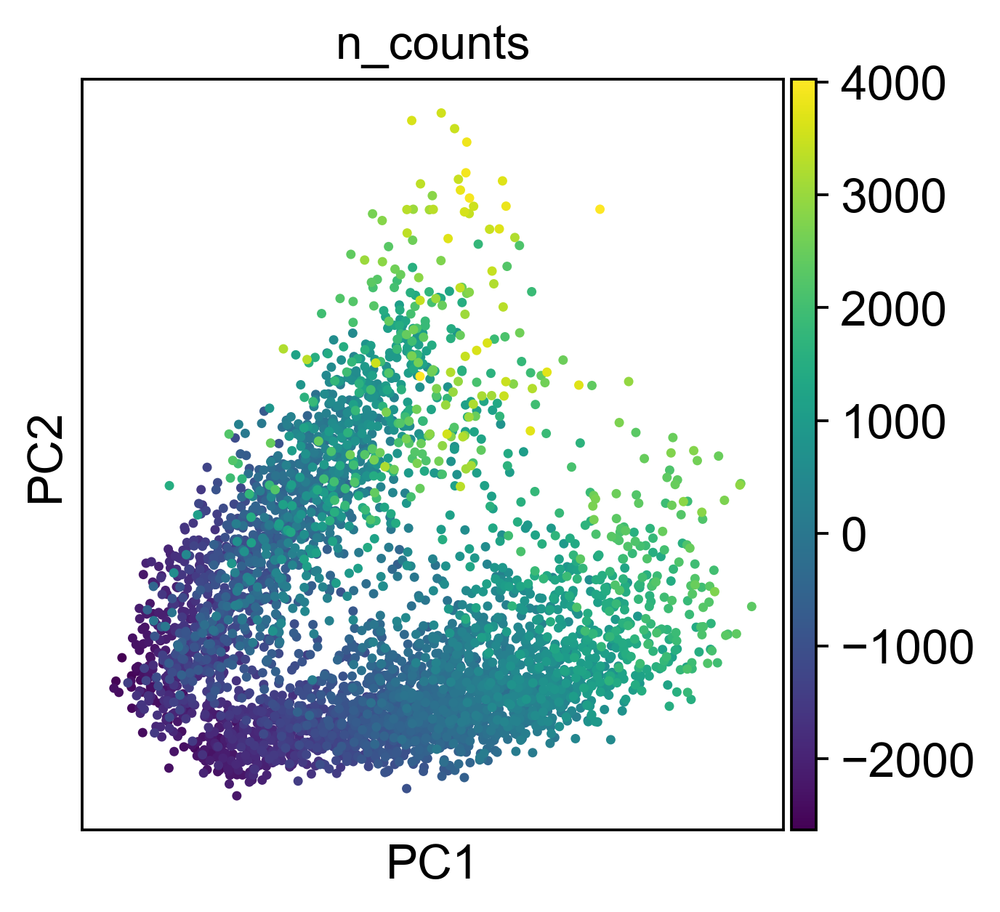

In [32]:
sc.pp.pca(adata, n_comps=30, use_highly_variable=True, svd_solver='arpack')
sc.pl.pca_scatter(adata, color='n_counts')

computing PCA
    on highly variable genes
    with n_comps=30
    finished (0:00:00)


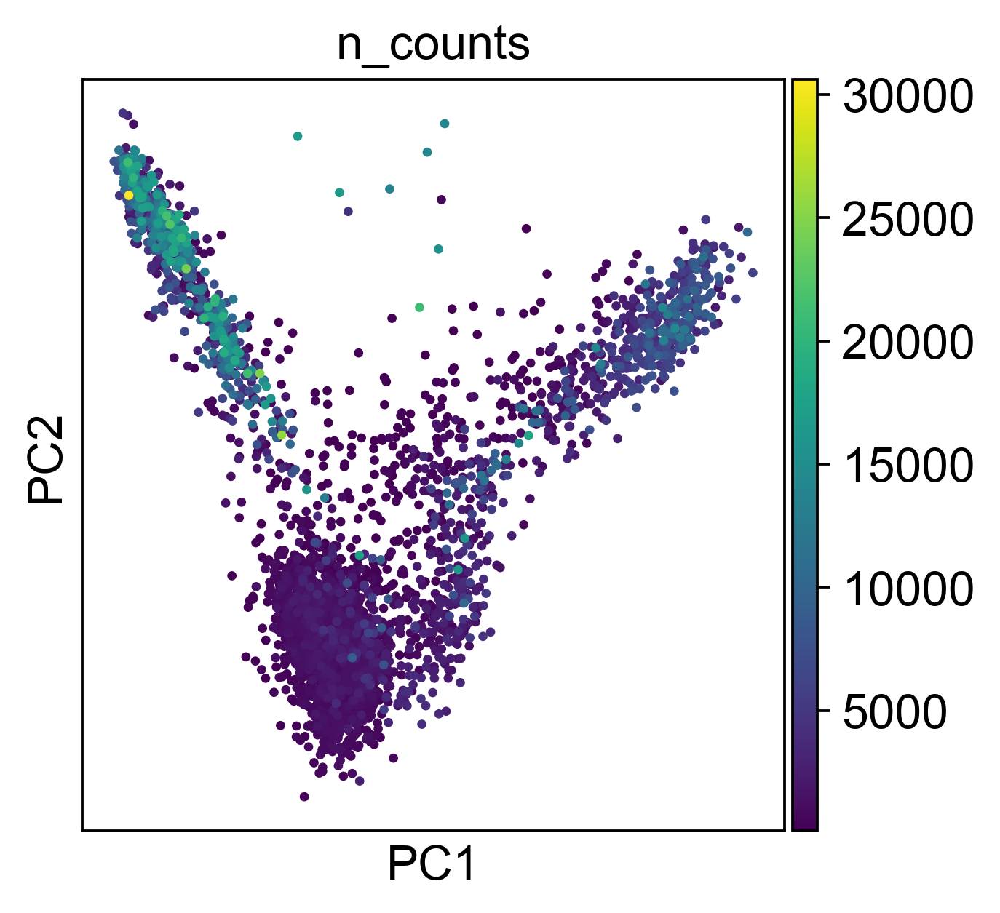

In [33]:
sc.pp.pca(adata3, n_comps=30, use_highly_variable=True, svd_solver='arpack')
sc.pl.pca_scatter(adata3, color='n_counts')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:09)


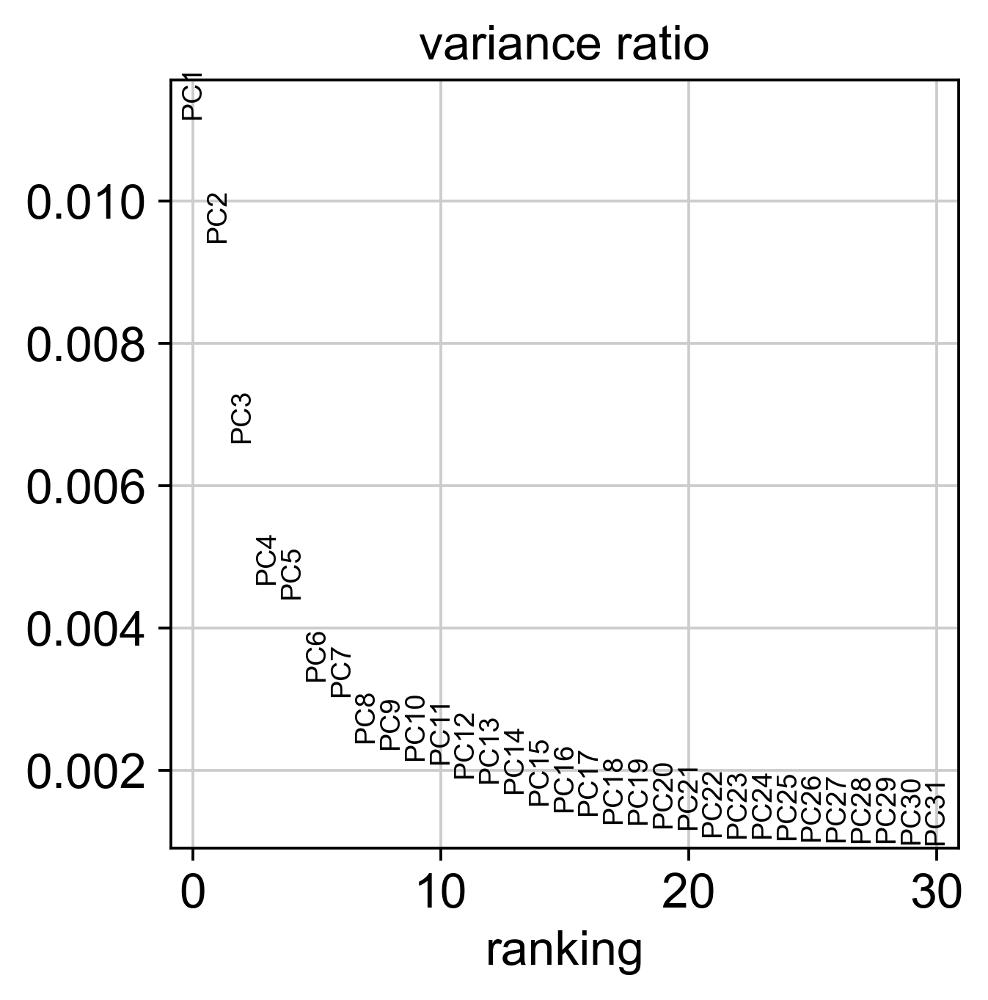

In [34]:
sc.pp.pca(adata, svd_solver='arpack') 
sc.pl.pca_variance_ratio(adata)

computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


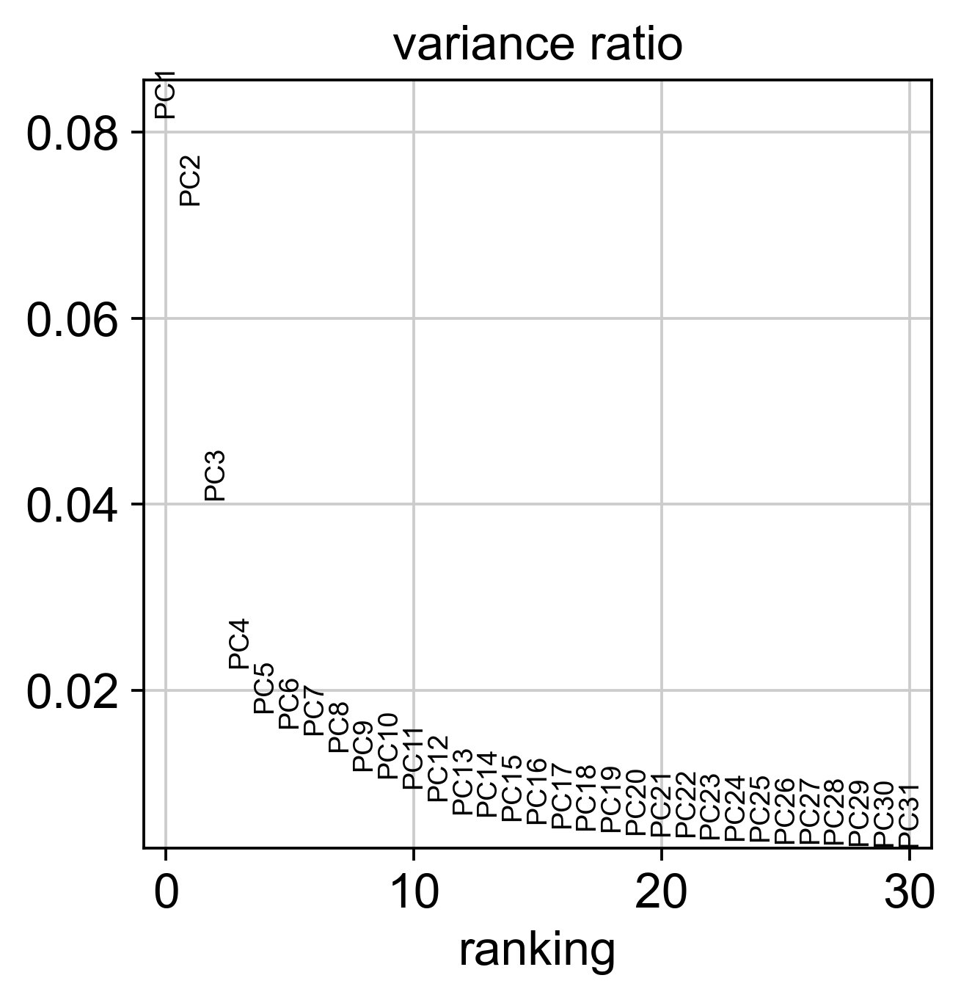

In [35]:
sc.pp.pca(adata3, svd_solver='auto') 
sc.pl.pca_variance_ratio(adata3)

computing PCA
    on highly variable genes
    with n_comps=30
    finished (0:00:07)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)


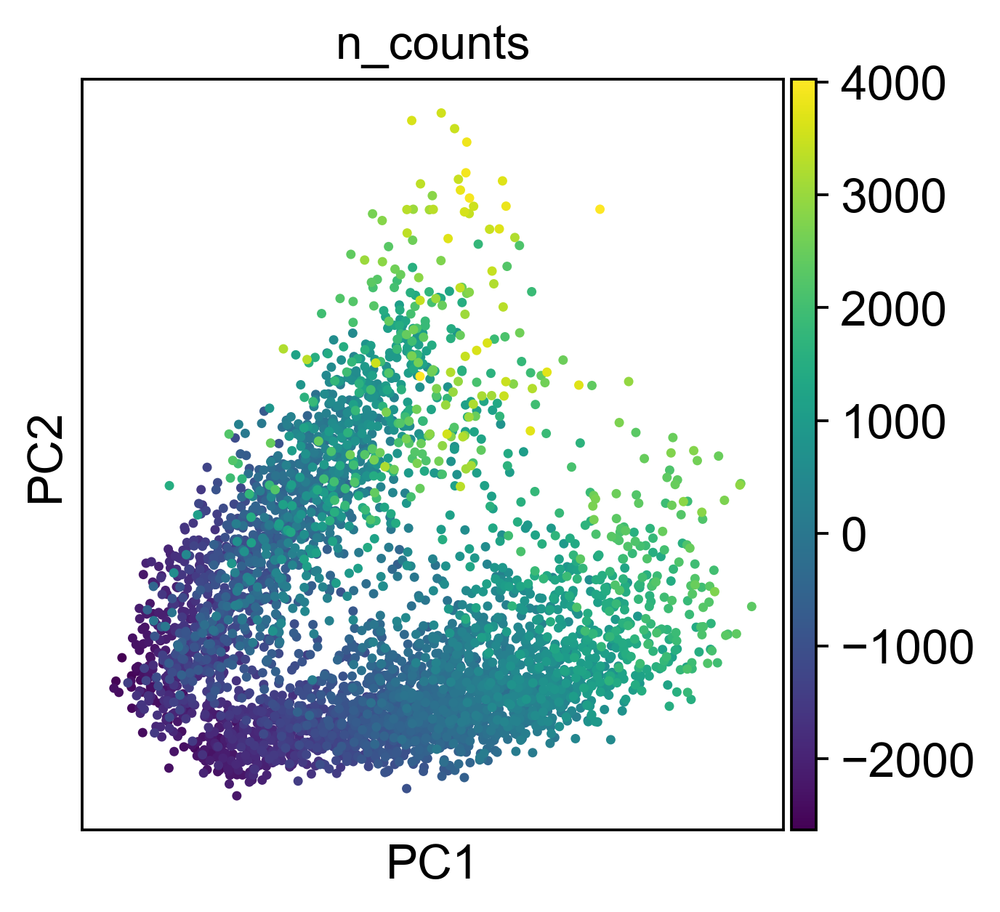

In [36]:
sc.pp.pca(adata, n_comps=30, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors = 7)
sc.pl.pca_scatter(adata, color='n_counts')

computing PCA
    on highly variable genes
    with n_comps=30
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


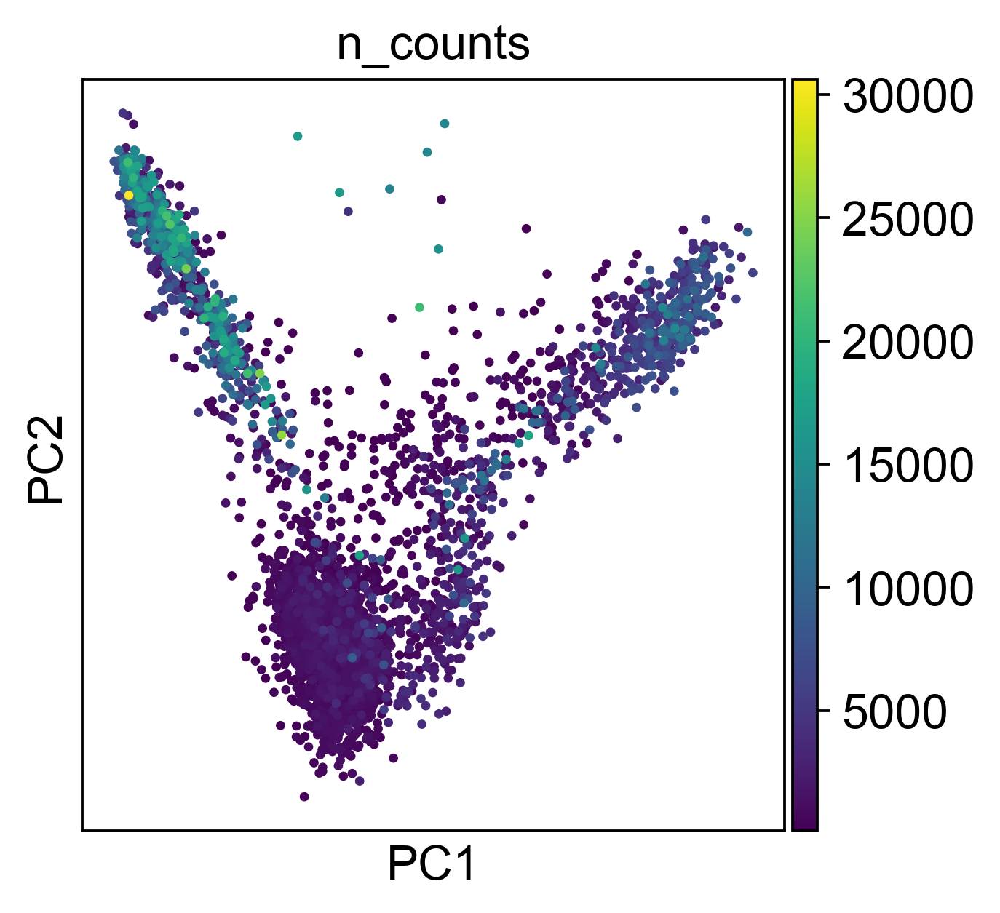

In [37]:
sc.pp.pca(adata3, n_comps=30, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata3, n_neighbors = 5)
sc.pl.pca_scatter(adata3, color='n_counts')

computing PCA
    on highly variable genes
    with n_comps=30
    finished (0:00:08)
computing tSNE
    using 'X_pca' with n_pcs = 30
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:51)


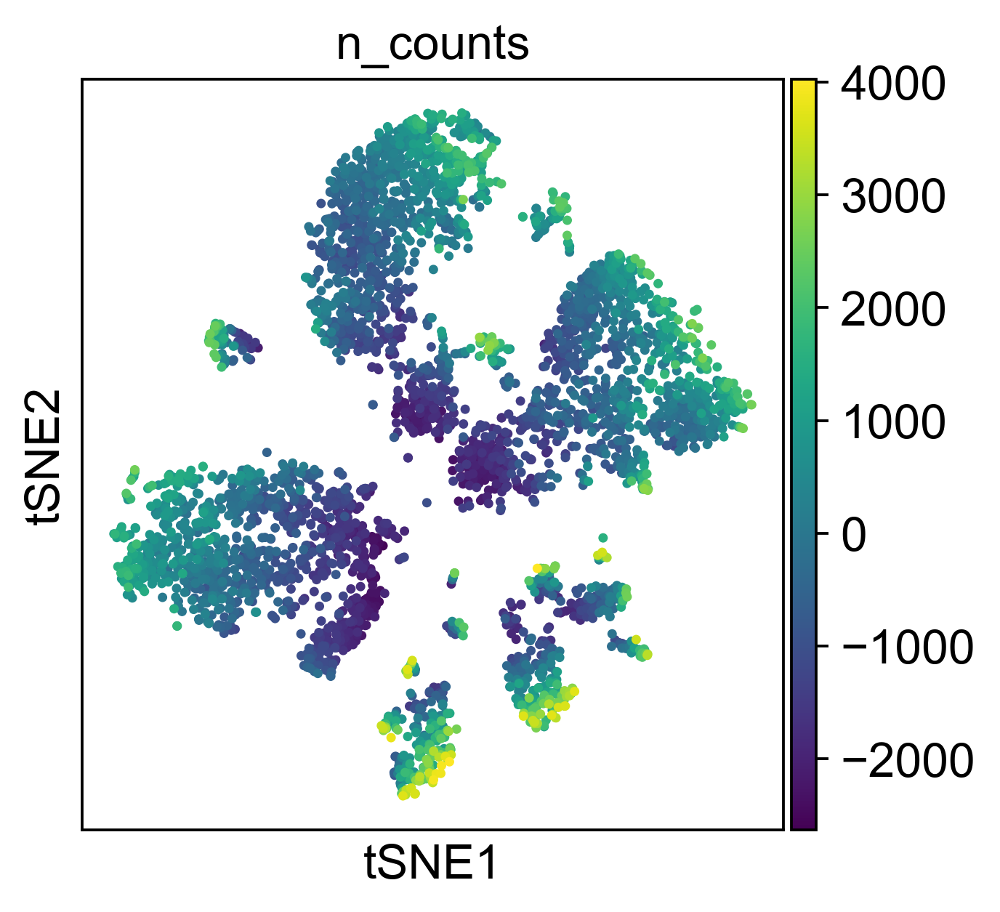

In [38]:
sc.pp.pca(adata, n_comps=30, use_highly_variable=True, svd_solver='arpack')
sc.tl.tsne(adata, n_jobs=1) 
#Note n_jobs works for MulticoreTSNE, but no t regular implementation)
sc.pl.tsne(adata, color='n_counts')

computing PCA
    on highly variable genes
    with n_comps=30
    finished (0:00:00)
computing tSNE
    using 'X_pca' with n_pcs = 30
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:01:01)


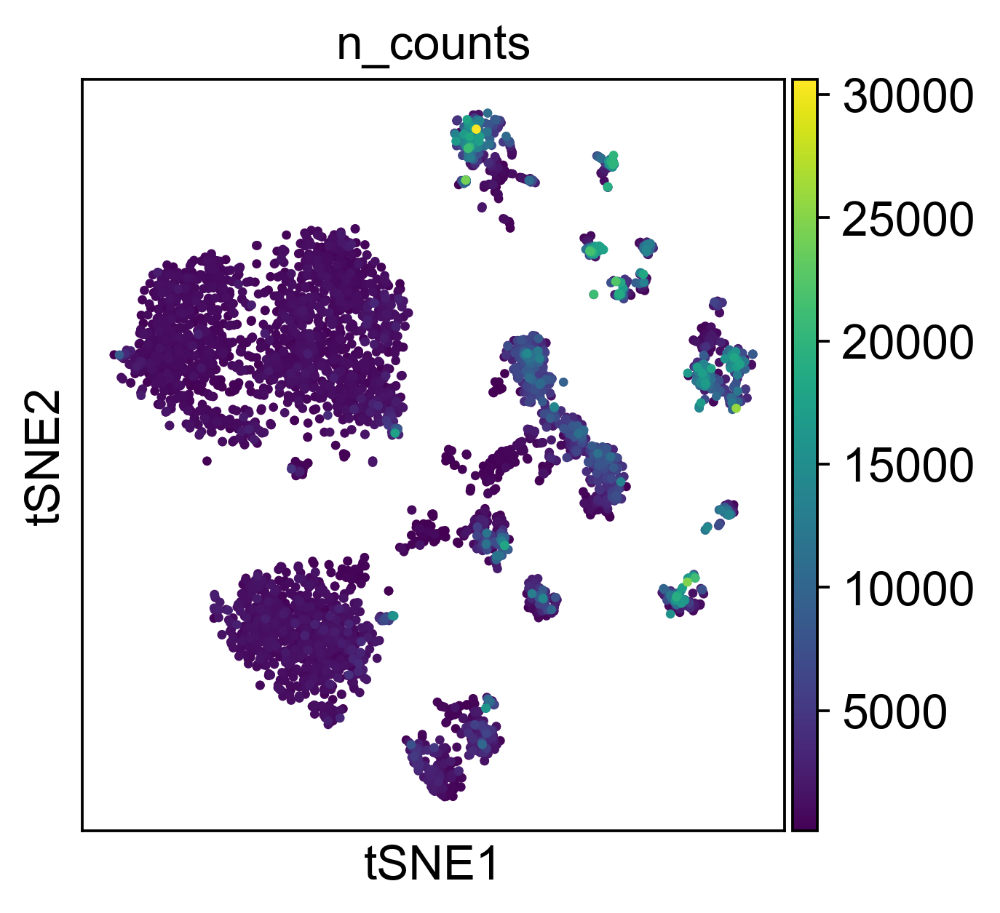

In [39]:
sc.pp.pca(adata3, n_comps=30, use_highly_variable=True, svd_solver='arpack')
sc.tl.tsne(adata3, n_jobs=1) 
#Note n_jobs works for MulticoreTSNE, but no t regular implementation)
sc.pl.tsne(adata3, color='n_counts')

In [41]:
sc.tl.louvain(adata, key_added='louvain_r1')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 17 clusters and added
    'louvain_r1', the cluster labels (adata.obs, categorical) (0:00:00)


In [42]:
sc.tl.louvain(adata3, key_added='louvain_r1')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 24 clusters and added
    'louvain_r1', the cluster labels (adata.obs, categorical) (0:00:00)


In [43]:
adata.obs['louvain_r1'].value_counts()

0     597
1     473
2     396
3     321
4     308
5     287
6     262
7     219
8     201
9     198
10    190
11    175
12    141
13     81
14     56
15     49
16     25
Name: louvain_r1, dtype: int64

In [44]:
adata.obs.head()

,n_counts,log_counts,n_genes,louvain_r1
SNAP1_TCCATATTTCAT,1400.546875,7.244618,2348,1
SNAP1_CCGTAACGCGCC,685.083069,6.529540,1951,1
SNAP1_ACCACAACGACC,1357.953613,7.213734,2322,1
SNAP1_CTCCTAGGATCC,458.743317,6.128491,1925,1
SNAP1_TATGCGGGAGAT,1870.931396,7.534192,2369,1


In [45]:
adata3.obs['louvain_r1'].value_counts()

0     700
1     549
2     429
3     416
4     212
5     207
6     196
7     171
8     159
10    155
9     155
11    140
12    129
13     85
14     78
15     75
16     74
17     59
18     41
19     34
20     31
21     26
22     18
23      8
Name: louvain_r1, dtype: int64

In [46]:
sc.tl.rank_genes_groups(adata, groupby='louvain_r1', key_added='rank_genes_r1')

ranking genes


/Users/harpreetsetia/anaconda3/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:252: RuntimeWarning: invalid value encountered in log2
  rankings_gene_logfoldchanges.append(np.log2(foldchanges[global_indices]))


    finished: added to `.uns['rank_genes_r1']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:28)


In [47]:
sc.tl.rank_genes_groups(adata3, groupby='louvain_r1', key_added='rank_genes_r1')

ranking genes
    finished: added to `.uns['rank_genes_r1']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


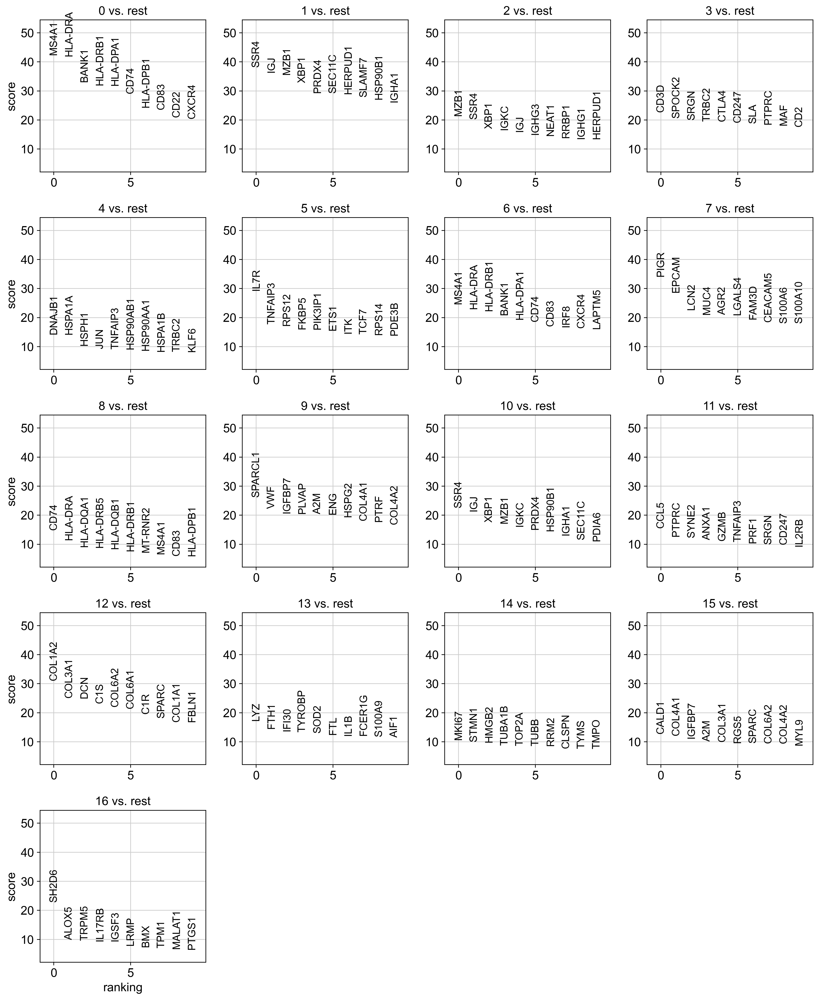

In [48]:
#graph
sc.pl.rank_genes_groups(adata, key='rank_genes_r1', fontsize=12, n_genes = 10)

computing tSNE
    using 'X_pca' with n_pcs = 30
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:01:10)


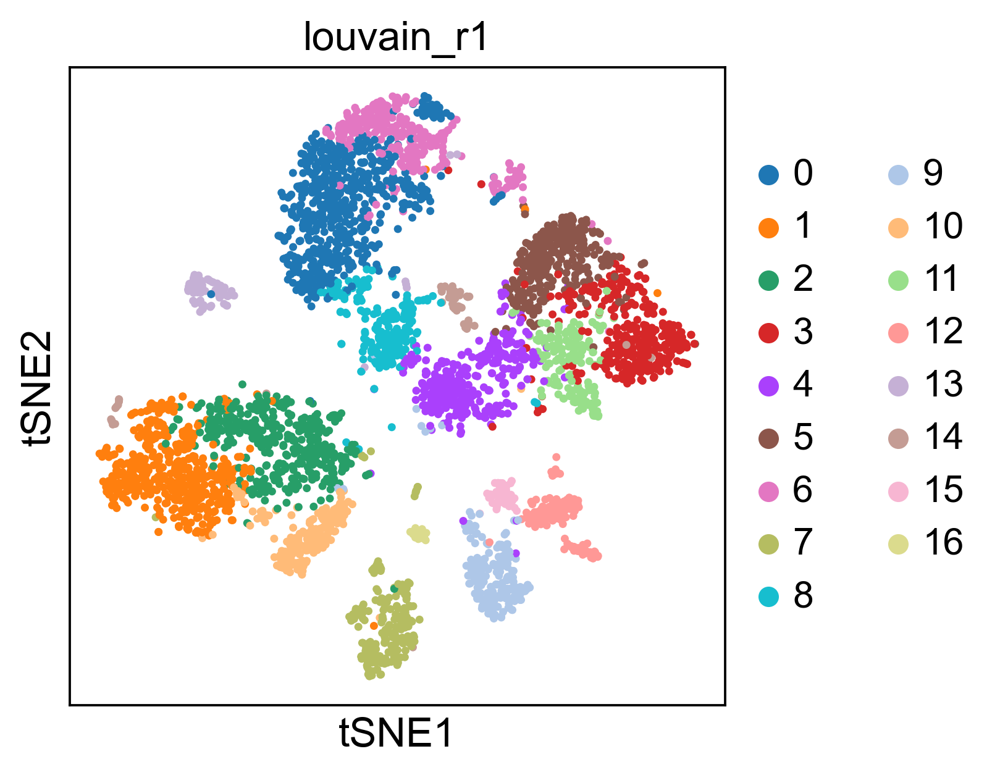

In [52]:
sc.tl.tsne(adata, n_jobs=1) 
#Note n_jobs works for MulticoreTSNE, but no t regular implementation)
sc.pl.tsne(adata, color='louvain_r1')

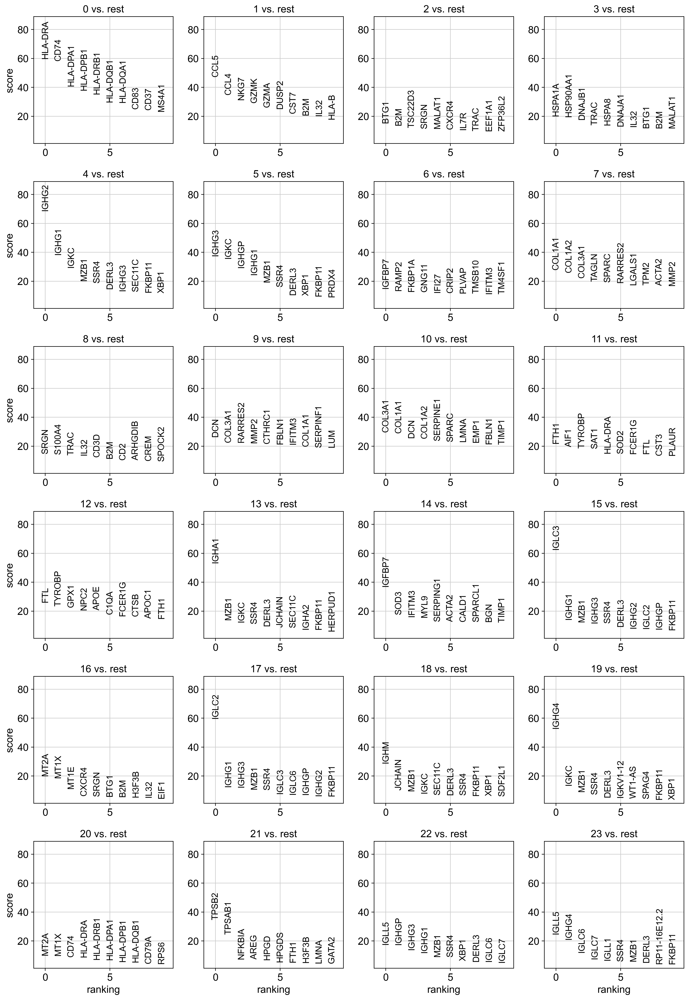

In [49]:
#graph
sc.pl.rank_genes_groups(adata3, key='rank_genes_r1', fontsize=12, n_genes = 10)

computing tSNE
    using 'X_pca' with n_pcs = 30
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:53)


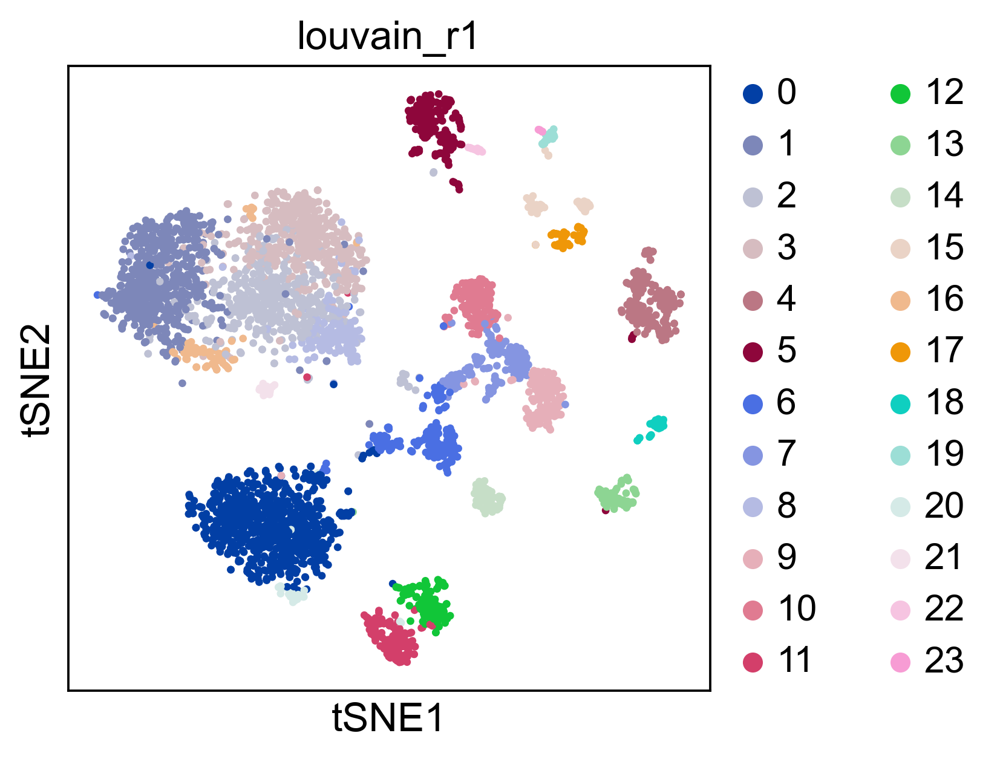

In [53]:
sc.tl.tsne(adata3, n_jobs=1) 
#Note n_jobs works for MulticoreTSNE, but no t regular implementation)
sc.pl.tsne(adata3, color='louvain_r1')

In [50]:
pd.DataFrame(adata.uns['rank_genes_r1']['names']).head(50)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,MS4A1,SSR4,MZB1,CD3D,DNAJB1,IL7R,MS4A1,PIGR,CD74,SPARCL1,SSR4,CCL5,COL1A2,LYZ,MKI67,CALD1,SH2D6
1,HLA-DRA,IGJ,SSR4,SPOCK2,HSPA1A,TNFAIP3,HLA-DRA,EPCAM,HLA-DRA,VWF,IGJ,PTPRC,COL3A1,FTH1,STMN1,COL4A1,ALOX5
2,BANK1,MZB1,XBP1,SRGN,HSPH1,RPS12,HLA-DRB1,LCN2,HLA-DQA1,IGFBP7,XBP1,SYNE2,DCN,IFI30,HMGB2,IGFBP7,TRPM5
3,HLA-DRB1,XBP1,IGKC,TRBC2,JUN,FKBP5,BANK1,MUC4,HLA-DRB5,PLVAP,MZB1,ANXA1,C1S,TYROBP,TUBA1B,A2M,IL17RB
4,HLA-DPA1,PRDX4,IGJ,CTLA4,TNFAIP3,PIK3IP1,HLA-DPA1,AGR2,HLA-DQB1,A2M,IGKC,GZMB,COL6A2,SOD2,TOP2A,COL3A1,IGSF3
5,CD74,SEC11C,IGHG3,CD247,HSP90AB1,ETS1,CD74,LGALS4,HLA-DRB1,ENG,PRDX4,TNFAIP3,COL6A1,FTL,TUBB,RGS5,LRMP
6,HLA-DPB1,HERPUD1,NEAT1,SLA,HSP90AA1,ITK,CD83,FAM3D,MT-RNR2,HSPG2,HSP90B1,PRF1,C1R,IL1B,RRM2,SPARC,BMX
7,CD83,SLAMF7,RRBP1,PTPRC,HSPA1B,TCF7,IRF8,CEACAM5,MS4A1,COL4A1,IGHA1,SRGN,SPARC,FCER1G,CLSPN,COL6A2,TPM1
8,CD22,HSP90B1,IGHG1,MAF,TRBC2,RPS14,CXCR4,S100A6,CD83,PTRF,SEC11C,CD247,COL1A1,S100A9,TYMS,COL4A2,MALAT1
9,CXCR4,IGHA1,HERPUD1,CD2,KLF6,PDE3B,LAPTM5,S100A10,HLA-DPB1,COL4A2,PDIA6,IL2RB,FBLN1,AIF1,TMPO,MYL9,PTGS1


In [87]:
result = adata.uns['rank_genes_r1']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(5)

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,...,12_n,12_p,13_n,13_p,14_n,14_p,15_n,15_p,16_n,16_p
0,MS4A1,4.182971e-240,SSR4,2.055844e-161,MZB1,1.812101e-80,CD3D,6.115699e-83,DNAJB1,9.674061e-40,...,COL1A2,7.445177e-73,LYZ,1.165842e-29,MKI67,2.230906e-16,CALD1,7.113700e-19,SH2D6,1.998543e-18
1,HLA-DRA,2.371663e-216,IGJ,1.080906e-177,SSR4,2.758087e-73,SPOCK2,3.868998e-72,HSPA1A,1.195579e-39,...,COL3A1,3.872394e-57,FTH1,7.210134e-31,STMN1,1.009882e-15,COL4A1,2.210168e-18,ALOX5,3.359339e-11
2,BANK1,5.526649e-165,MZB1,1.775608e-168,XBP1,4.129874e-55,SRGN,1.991982e-68,HSPH1,3.419825e-23,...,DCN,2.438605e-54,IFI30,9.903750e-27,HMGB2,6.299095e-16,IGFBP7,7.023836e-18,TRPM5,8.485911e-10
3,HLA-DRB1,4.827354e-162,XBP1,3.889351e-151,IGKC,7.120271e-53,TRBC2,1.207448e-66,JUN,2.889622e-19,...,C1S,4.962254e-52,TYROBP,1.028819e-22,TUBA1B,2.141661e-14,A2M,1.922148e-15,IL17RB,1.006857e-09
4,HLA-DPA1,4.137209e-161,PRDX4,1.640995e-134,IGJ,7.706192e-50,CTLA4,2.524527e-61,TNFAIP3,8.343402e-19,...,COL6A2,2.723124e-50,SOD2,1.075769e-25,TOP2A,1.791800e-12,COL3A1,7.360065e-15,IGSF3,1.402749e-09


In [51]:
pd.DataFrame(adata3.uns['rank_genes_r1']['names'])

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
0,HLA-DRA,CCL5,BTG1,HSPA1A,IGHG2,IGHG3,IGFBP7,COL1A1,SRGN,DCN,...,IGFBP7,IGLC3,MT2A,IGLC2,IGHM,IGHG4,MT2A,TPSB2,IGLL5,IGLL5
1,CD74,CCL4,B2M,HSP90AA1,IGHG1,IGKC,RAMP2,COL1A2,S100A4,COL3A1,...,SOD3,IGHG1,MT1X,IGHG1,JCHAIN,IGKC,MT1X,TPSAB1,IGHGP,IGHG4
2,HLA-DPA1,NKG7,TSC22D3,DNAJB1,IGKC,IGHGP,FKBP1A,COL3A1,TRAC,RARRES2,...,IFITM3,MZB1,MT1E,IGHG3,MZB1,MZB1,CD74,NFKBIA,IGHG3,IGLC6
3,HLA-DPB1,GZMK,SRGN,TRAC,MZB1,IGHG1,GNG11,TAGLN,IL32,MMP2,...,MYL9,IGHG3,CXCR4,MZB1,IGKC,SSR4,HLA-DRA,AREG,IGHG1,IGLC7
4,HLA-DRB1,GZMA,MALAT1,HSPA8,SSR4,MZB1,IFI27,SPARC,CD3D,CTHRC1,...,SERPING1,SSR4,SRGN,SSR4,SEC11C,DERL3,HLA-DRB1,HPGD,MZB1,IGLL1
5,HLA-DQB1,DUSP2,CXCR4,DNAJA1,DERL3,SSR4,CRIP2,RARRES2,B2M,FBLN1,...,ACTA2,DERL3,BTG1,IGLC3,DERL3,IGKV1-12,HLA-DPA1,HPGDS,SSR4,SSR4
6,HLA-DQA1,CST7,IL7R,IL32,IGHG3,DERL3,PLVAP,LGALS1,CD2,IFITM3,...,CALD1,IGHG2,B2M,IGLC6,SSR4,WT1-AS,HLA-DPB1,FTH1,XBP1,MZB1
7,CD83,B2M,TRAC,BTG1,SEC11C,XBP1,TMSB10,TPM2,ARHGDIB,COL1A1,...,SPARCL1,IGLC2,H3F3B,IGHGP,FKBP11,SPAG4,HLA-DQB1,H3F3B,DERL3,DERL3
8,CD37,IL32,EEF1A1,B2M,FKBP11,FKBP11,IFITM3,ACTA2,CREM,SERPINF1,...,BGN,IGHGP,IL32,IGHG2,XBP1,FKBP11,CD79A,LMNA,IGLC6,RP11-16E12.2
9,MS4A1,HLA-B,ZFP36L2,MALAT1,XBP1,PRDX4,TM4SF1,MMP2,SPOCK2,LUM,...,TIMP1,FKBP11,EIF1,FKBP11,SDF2L1,XBP1,RPS6,GATA2,IGLC7,FKBP11


In [88]:
result = adata3.uns['rank_genes_r1']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(5)

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,...,19_n,19_p,20_n,20_p,21_n,21_p,22_n,22_p,23_n,23_p
0,HLA-DRA,0.000000e+00,CCL5,1.907528e-228,BTG1,5.514960e-47,HSPA1A,6.891259e-73,IGHG2,9.099118e-231,...,IGHG4,2.233484e-50,MT2A,2.261189e-14,TPSB2,3.968423e-24,IGLL5,7.958028e-16,IGLL5,2.334332e-09
1,CD74,0.000000e+00,CCL4,2.861756e-151,B2M,4.203654e-38,HSP90AA1,4.072521e-70,IGHG1,1.678097e-128,...,IGKC,2.489972e-16,MT1X,5.248237e-13,TPSAB1,1.508550e-19,IGHGP,8.350821e-15,IGHG4,8.608394e-11
2,HLA-DPA1,9.389529e-239,NKG7,2.595224e-132,TSC22D3,3.130245e-31,DNAJB1,6.594866e-59,IGKC,1.541472e-102,...,MZB1,1.655248e-12,CD74,6.025286e-11,NFKBIA,1.380412e-09,IGHG3,8.369724e-12,IGLC6,9.515317e-09
3,HLA-DPB1,7.180516e-215,GZMK,4.542497e-122,SRGN,1.890997e-28,TRAC,1.467773e-39,MZB1,4.851038e-64,...,SSR4,7.656871e-10,HLA-DRA,8.070252e-11,AREG,1.634007e-08,IGHG1,1.105774e-10,IGLC7,8.596886e-06
4,HLA-DRB1,8.195521e-195,GZMA,9.100338e-107,MALAT1,9.022407e-28,HSPA8,7.440433e-39,SSR4,3.602588e-57,...,DERL3,2.168668e-06,HLA-DRB1,2.097969e-09,HPGD,2.633835e-07,MZB1,1.417549e-10,IGLL1,7.556764e-05


In [82]:
a = pd.DataFrame(adata.uns['rank_genes_r1']['names']).head(100)
a.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,MS4A1,SSR4,MZB1,CD3D,DNAJB1,IL7R,MS4A1,PIGR,CD74,SPARCL1,SSR4,CCL5,COL1A2,LYZ,MKI67,CALD1,SH2D6
1,HLA-DRA,IGJ,SSR4,SPOCK2,HSPA1A,TNFAIP3,HLA-DRA,EPCAM,HLA-DRA,VWF,IGJ,PTPRC,COL3A1,FTH1,STMN1,COL4A1,ALOX5
2,BANK1,MZB1,XBP1,SRGN,HSPH1,RPS12,HLA-DRB1,LCN2,HLA-DQA1,IGFBP7,XBP1,SYNE2,DCN,IFI30,HMGB2,IGFBP7,TRPM5
3,HLA-DRB1,XBP1,IGKC,TRBC2,JUN,FKBP5,BANK1,MUC4,HLA-DRB5,PLVAP,MZB1,ANXA1,C1S,TYROBP,TUBA1B,A2M,IL17RB
4,HLA-DPA1,PRDX4,IGJ,CTLA4,TNFAIP3,PIK3IP1,HLA-DPA1,AGR2,HLA-DQB1,A2M,IGKC,GZMB,COL6A2,SOD2,TOP2A,COL3A1,IGSF3


In [94]:
UC_top12_cluster = a.iloc[:,0:13]
UC_top12_cluster

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,MS4A1,SSR4,MZB1,CD3D,DNAJB1,IL7R,MS4A1,PIGR,CD74,SPARCL1,SSR4,CCL5,COL1A2
1,HLA-DRA,IGJ,SSR4,SPOCK2,HSPA1A,TNFAIP3,HLA-DRA,EPCAM,HLA-DRA,VWF,IGJ,PTPRC,COL3A1
2,BANK1,MZB1,XBP1,SRGN,HSPH1,RPS12,HLA-DRB1,LCN2,HLA-DQA1,IGFBP7,XBP1,SYNE2,DCN
3,HLA-DRB1,XBP1,IGKC,TRBC2,JUN,FKBP5,BANK1,MUC4,HLA-DRB5,PLVAP,MZB1,ANXA1,C1S
4,HLA-DPA1,PRDX4,IGJ,CTLA4,TNFAIP3,PIK3IP1,HLA-DPA1,AGR2,HLA-DQB1,A2M,IGKC,GZMB,COL6A2
5,CD74,SEC11C,IGHG3,CD247,HSP90AB1,ETS1,CD74,LGALS4,HLA-DRB1,ENG,PRDX4,TNFAIP3,COL6A1
6,HLA-DPB1,HERPUD1,NEAT1,SLA,HSP90AA1,ITK,CD83,FAM3D,MT-RNR2,HSPG2,HSP90B1,PRF1,C1R
7,CD83,SLAMF7,RRBP1,PTPRC,HSPA1B,TCF7,IRF8,CEACAM5,MS4A1,COL4A1,IGHA1,SRGN,SPARC
8,CD22,HSP90B1,IGHG1,MAF,TRBC2,RPS14,CXCR4,S100A6,CD83,PTRF,SEC11C,CD247,COL1A1
9,CXCR4,IGHA1,HERPUD1,CD2,KLF6,PDE3B,LAPTM5,S100A10,HLA-DPB1,COL4A2,PDIA6,IL2RB,FBLN1


In [83]:
b = pd.DataFrame(adata3.uns['rank_genes_r1']['names']).head(100)
b.head()

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
0,HLA-DRA,CCL5,BTG1,HSPA1A,IGHG2,IGHG3,IGFBP7,COL1A1,SRGN,DCN,...,IGFBP7,IGLC3,MT2A,IGLC2,IGHM,IGHG4,MT2A,TPSB2,IGLL5,IGLL5
1,CD74,CCL4,B2M,HSP90AA1,IGHG1,IGKC,RAMP2,COL1A2,S100A4,COL3A1,...,SOD3,IGHG1,MT1X,IGHG1,JCHAIN,IGKC,MT1X,TPSAB1,IGHGP,IGHG4
2,HLA-DPA1,NKG7,TSC22D3,DNAJB1,IGKC,IGHGP,FKBP1A,COL3A1,TRAC,RARRES2,...,IFITM3,MZB1,MT1E,IGHG3,MZB1,MZB1,CD74,NFKBIA,IGHG3,IGLC6
3,HLA-DPB1,GZMK,SRGN,TRAC,MZB1,IGHG1,GNG11,TAGLN,IL32,MMP2,...,MYL9,IGHG3,CXCR4,MZB1,IGKC,SSR4,HLA-DRA,AREG,IGHG1,IGLC7
4,HLA-DRB1,GZMA,MALAT1,HSPA8,SSR4,MZB1,IFI27,SPARC,CD3D,CTHRC1,...,SERPING1,SSR4,SRGN,SSR4,SEC11C,DERL3,HLA-DRB1,HPGD,MZB1,IGLL1


In [84]:
CD_top12_clusters = b.iloc[:,0:13]
CD_top12_clusters.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,HLA-DRA,CCL5,BTG1,HSPA1A,IGHG2,IGHG3,IGFBP7,COL1A1,SRGN,DCN,COL3A1,FTH1,FTL
1,CD74,CCL4,B2M,HSP90AA1,IGHG1,IGKC,RAMP2,COL1A2,S100A4,COL3A1,COL1A1,AIF1,TYROBP
2,HLA-DPA1,NKG7,TSC22D3,DNAJB1,IGKC,IGHGP,FKBP1A,COL3A1,TRAC,RARRES2,DCN,TYROBP,GPX1
3,HLA-DPB1,GZMK,SRGN,TRAC,MZB1,IGHG1,GNG11,TAGLN,IL32,MMP2,COL1A2,SAT1,NPC2
4,HLA-DRB1,GZMA,MALAT1,HSPA8,SSR4,MZB1,IFI27,SPARC,CD3D,CTHRC1,SERPINE1,HLA-DRA,APOE


In [85]:
UC_top12_cluster.shape, CD_top12_clusters.shape

((100, 13), (100, 13))

In [104]:
in_list_1 = list(UC_top12_cluster['0'])
in_list_2 = list(UC_top12_cluster['1'])
check_list = list(CD_top12_clusters['0'])

In [106]:
list1 = [in_list_1]
check_list  = check_list

result = [[j for j in i if j in check_list] for i in list1]
print(result)

[['MS4A1', 'HLA-DRA', 'BANK1', 'HLA-DRB1', 'HLA-DPA1', 'CD74', 'HLA-DPB1', 'CD83', 'CXCR4', 'IRF8', 'LAPTM5', 'CD19', 'CD37', 'HLA-DMB', 'CD69', 'CD79B', 'CD79A', 'BLK', 'RPS12', 'HLA-DQA1', 'RPS19', 'RPL13A', 'RPL13', 'CD52', 'HLA-DQB1', 'RPS6', 'LINC00926', 'RPS5', 'RPS11', 'RPS8', 'LTB', 'RPL19', 'HLA-DMA', 'RPL18', 'RPL10A', 'RPS18', 'LY9']]


In [129]:
UC_list =  list(UC_top12_cluster.iloc[:,12])
CD_list = list(CD_top12_clusters.iloc[:,12])

list_list = [UC_list]
result = [[j for j in i if j in CD_list] for i in list_list]
print(result)

[['VIM', 'APOE', 'TMEM176B', 'CST3', 'LGALS1']]


In [131]:
for i in range(0, len(UC_top12_cluster.loc[0])):
    
    UC_list =  list(UC_top12_cluster.iloc[:,i])
    CD_list = list(CD_top12_clusters.iloc[:,i])
    list_list = [UC_list]
    
    result = [[j for j in i if j in CD_list] for i in list_list]
    print(result)
    
#print(result)

[['MS4A1', 'HLA-DRA', 'BANK1', 'HLA-DRB1', 'HLA-DPA1', 'CD74', 'HLA-DPB1', 'CD83', 'CXCR4', 'IRF8', 'LAPTM5', 'CD19', 'CD37', 'HLA-DMB', 'CD69', 'CD79B', 'CD79A', 'BLK', 'RPS12', 'HLA-DQA1', 'RPS19', 'RPL13A', 'RPL13', 'CD52', 'HLA-DQB1', 'RPS6', 'LINC00926', 'RPS5', 'RPS11', 'RPS8', 'LTB', 'RPL19', 'HLA-DMA', 'RPL18', 'RPL10A', 'RPS18', 'LY9']]
[[]]
[['MALAT1']]
[['CD3D', 'SRGN', 'TRBC2', 'CD2', 'FYB', 'TRAC', 'LCK', 'CREM', 'TIGIT', 'B2M', 'RGS1', 'TNFRSF4', 'BATF', 'EVL', 'CD3E', 'SOD1', 'ARHGDIB']]
[[]]
[[]]
[[]]
[['TPM1', 'ANXA2', 'IFI27', 'NUPR1']]
[['LTB', 'HMGB2', 'RPLP1', 'CD52', 'CORO1A', 'ACTB', 'COTL1']]
[['IFITM3', 'SPARC', 'IFI27', 'IGFBP4', 'PRKCDBP', 'NNMT']]
[['PPIB', 'GSTP1', 'KDELR2']]
[['SRGN', 'ITGB2']]
[['VIM', 'APOE', 'TMEM176B', 'CST3', 'LGALS1']]
